Project: Deep Learning for Image Classification
Till ditt slutprojekt i Deep Learning-kursen kommer du att ha möjlighet att söka djupinlärningstekniker till en utmanande bildklassificeringsuppgift. Detta projekt kommer att tillåta dig att visa din förståelse för djupa neurala nätverk, konvolutionella neurala nätverk (CNN) och överföringsinlärning för bildklassificering.

In [2]:
# bibliotek för att ignorera varningar
import warnings
warnings.filterwarnings('ignore')

# importering av bibliotek som behövsimport matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import sys

# bibliotek från funkiotner.py
import funktioner as fn

# bibliotek för Deep Learning
import tensorflow as tf

# bibliotek för machine learning
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, log_loss

Project Tasks:
Dataset Selection:

Välj en bilduppsättning som lämpar sig för klassificering i flera klasser. Det kan vara ett offentligt tillgänglig datauppsättning eller en anpassad datauppsättning relaterad till en specifik domän av intresse.
Se till att datamängden är tillräckligt stor och mångsidig för att ge ett utmanande problem för klassificering.
Lite deskription om datasetet:

Pistacium datasetet är ett dataset som innehåller bilder på pistacium nötter. Detta dataset innehåller också en excel-fil med en lista över pistaschmätningar indelade i två klasser.

Vad vi gjorde:

Vi har använt ett dataset från Kaggle som heter "muratkokludataset/pistachio-image-dataset"
Vi har kört en lite EDA på datasetet av attributerna för att se hur det ser ut.
Vi har prövat dela upp datasetet i clustrar och se hur det ser ut, med en PCA analys också.
Vi har kört en Machine Learning-modell på dataset och jämförde det med en Deep Learning-modell.

In [3]:
# spara vägen till filen i en variabel
PATH = sys.path[0] + '/data/'

In [5]:
# läsa in data från csv-fil och skapa en dataframe
df = pd.read_excel(PATH +'/dataset/dataset.xlsx', sheet_name='Pistachio_Dataset')

In [6]:
# skriver ut första 5 raderna i datasetena
df.head()

,AREA,PERIMETER,MAJOR_AXIS,MINOR_AXIS,ECCENTRICITY,EQDIASQ,SOLIDITY,CONVEX_AREA,EXTENT,ASPECT_RATIO,ROUNDNESS,COMPACTNESS,SHAPEFACTOR_1,SHAPEFACTOR_2,SHAPEFACTOR_3,SHAPEFACTOR_4,Class
0,63391,1568.405,390.3396,236.7461,0.7951,284.0984,0.8665,73160,0.6394,1.6488,0.3238,0.7278,0.0062,0.0037,0.5297,0.8734,Kirmizi_Pistachio
1,68358,1942.187,410.8594,234.7525,0.8207,295.0188,0.8765,77991,0.6772,1.7502,0.2277,0.7181,0.0060,0.0034,0.5156,0.9024,Kirmizi_Pistachio
2,73589,1246.538,452.3630,220.5547,0.8731,306.0987,0.9172,80234,0.7127,2.0510,0.5951,0.6767,0.0061,0.0030,0.4579,0.9391,Kirmizi_Pistachio
3,71106,1445.261,429.5291,216.0765,0.8643,300.8903,0.9589,74153,0.7028,1.9879,0.4278,0.7005,0.0060,0.0030,0.4907,0.9755,Kirmizi_Pistachio
4,80087,1251.524,469.3783,220.9344,0.8823,319.3273,0.9657,82929,0.7459,2.1245,0.6425,0.6803,0.0059,0.0028,0.4628,0.9833,Kirmizi_Pistachio


Antal rader och kolumner:  (2148, 17)
['AREA',
 'PERIMETER',
 'MAJOR_AXIS',
 'MINOR_AXIS',
 'ECCENTRICITY',
 'EQDIASQ',
 'SOLIDITY',
 'CONVEX_AREA',
 'EXTENT',
 'ASPECT_RATIO',
 'ROUNDNESS',
 'COMPACTNESS',
 'SHAPEFACTOR_1',
 'SHAPEFACTOR_2',
 'SHAPEFACTOR_3',
 'SHAPEFACTOR_4',
 'Class']
Antal rader per klass:  

Kirmizi_Pistachio    1232
Siit_Pistachio        916
Name: Class, dtype: int64


<AxesSubplot:>

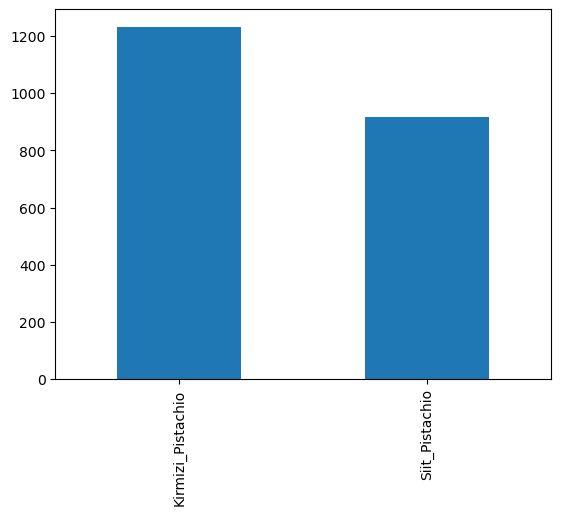

In [7]:
# vi ska spara några informationer om datasetet
# antal rader och kolumner
import pprint as pp
print('Antal rader och kolumner: ', df.shape)

# kolumner
pp.pprint(df.columns.to_list())

# antal rader per klass
print('Antal rader per klass: ', '\n')
pp.pprint(df['Class'].value_counts())

# printa ut grafiken som visar hur många rader det finns av varje klass
df['Class'].value_counts().plot(kind='bar')

För att upptäkta om det finns någon korrelation mellan kolumner i datasetet har vi använt oss av en pairplot matris. Vi har också använt oss av en PCA-analys för att se om det är möjligt att dela upp datasetet i clustrar.

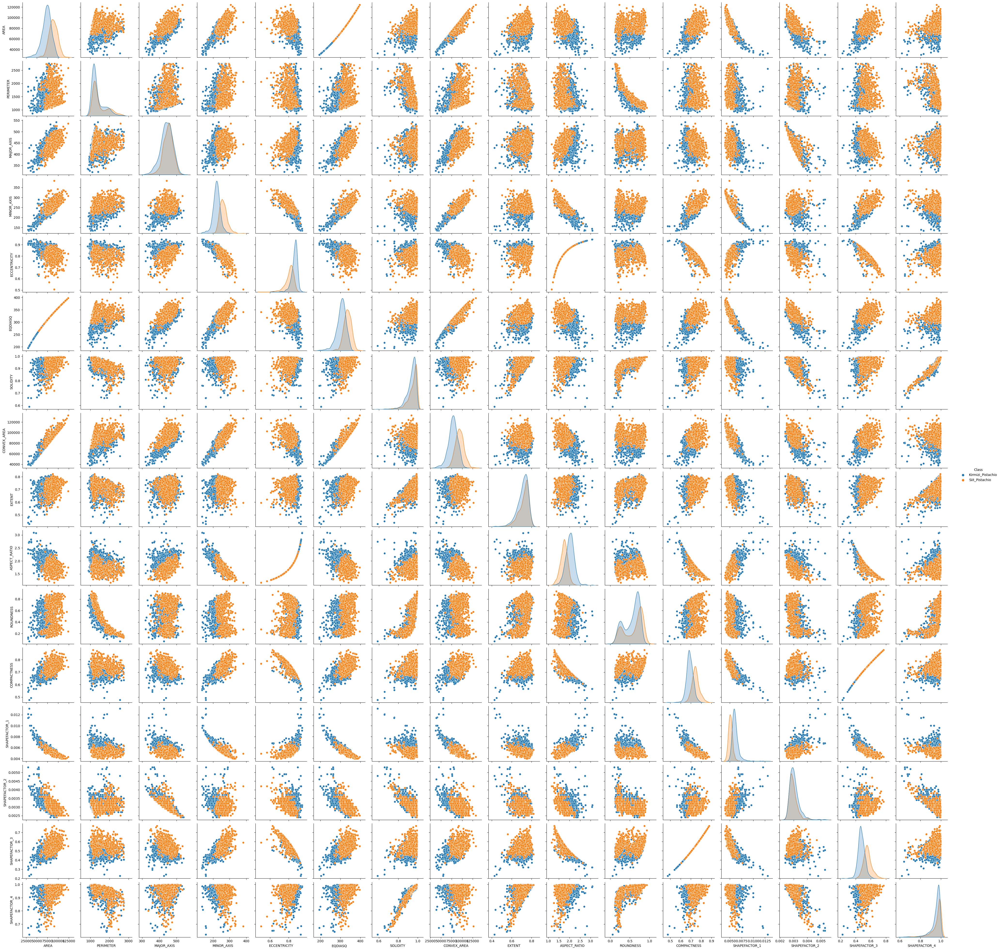

In [8]:
# Pairplot
df_cluster = df.copy()
cluster_classes = df_cluster['Class'].unique()
df_cluster['Class'].replace(cluster_classes,[0,1])

sns.pairplot(df_cluster, hue='Class')
plt.show()

Vi har 2 klasser: ['Kirmizi_Pistachio' 'Siit_Pistachio'], och 17 kolumner. Med PCA kan vi minska antalet dimensioner till 2.


original shape:    (2148, 16)
transformed shape: (2148, 2)


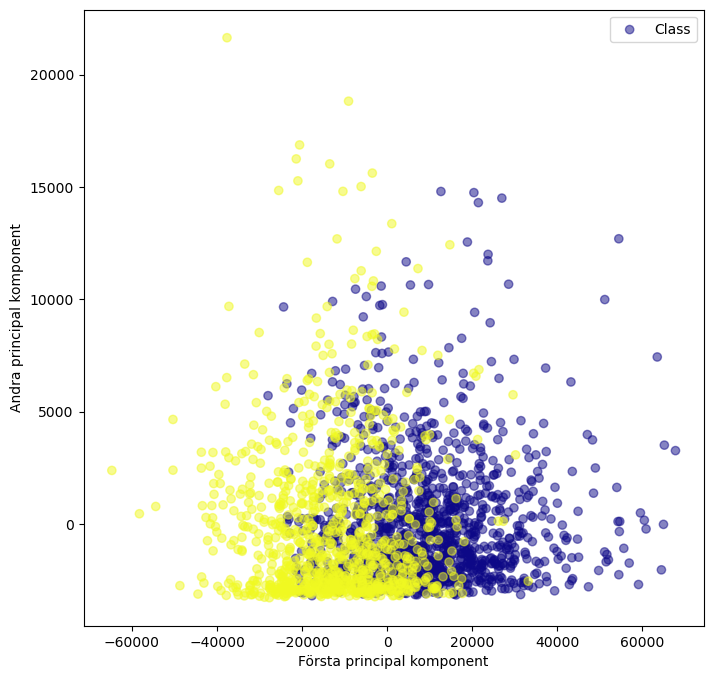

In [9]:
# PCA
# spara klasserna i en variabel
classes = df['Class'].unique()

# skapa en instans av PCA
pca = PCA(n_components=2)

# skapa en variabel för X och y
X = df.drop('Class', axis=1)
colors = df['Class'].replace(classes,[0,1])

# träna PCA
pca.fit(X)

# transformera data
X_pca = pca.transform(X)

# kolla shape och printa ut information
print(f'Vi har {len(classes)} klasser: {classes}, och {len(df.columns)} kolumner. Med PCA kan vi minska antalet dimensioner till {pca.n_components}.')
print('\n')
print("original shape:   ", X.shape)
print("transformed shape:", X_pca.shape)

# plotta PCA
plt.figure(figsize=(8,8))
plt.scatter(x=X_pca[:,0], y=X_pca[:,1], c=colors, cmap='plasma', alpha=0.5, label='Class')
plt.xlabel('Första principal komponent')
plt.ylabel('Andra principal komponent')
plt.legend()
plt.show()

Sammanfattning av analysen:

Pairplot har visat att det inte finns någon tydlig skillnad mellan de olika klasserna.
PCA-analys framkom det att pistagenötter inte kunna delas upp exakt i två distinkta kluster.
Så vi har kommit fram till att det är svårt att klassificera pistagenötter med hjälp av Machine Learning-modeller, men vi prövade ändå att köra en Machine Learning-modell på datasetet. Vi har också kört en Deep Learning-modell på datasetet och jämförde resultatet med Machine Learning-modellen.

ML - Modell: Logistic Regression

vi har använt en Logistic Regression-modell för att se om vi kan få en bättre klassificering av datasetet.
sen har vi sparat Loss och Accuracy för att jämföra med en Deep Learning-modell.

In [10]:
# Skapa variabler för att lagra data
X = df.drop('Class', axis=1)
y = df['Class'].replace(classes,[0,1])

In [11]:
# vi provar att använda en övervakat lärande metod för att träna en modell som kan klassificera 
# pistagenötter. Vi använder en Logistik Regression.
logisticRegr = LogisticRegression()
logisticRegr.fit(X, y)
predictions = logisticRegr.predict(X)

In [12]:
# Beräkna noggrannheten och Loss
loss_reg = log_loss(y, logisticRegr.predict_proba(X))
accuracy_reg = logisticRegr.score(X, y)


DL - Modell: Neural Network

vi har kört en loop för att hitta den bästa modellen för detta datasetet som har Loss och Accuracy minre än Logistic Regression.
sen har vi sparat den bästa modellen i en fil.

Modell skapas... 
Training...
vi måste få en loss mindre än 0.32307201516292183 och en accuracy större än 0.86731843575419
...


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input (Dense)               (None, 8)                 136       
                                                                 
 hidden1 (Dense)             (None, 12)                108       
                                                                 
 hidden2 (Dense)             (None, 12)                156       
                                                                 
 output (Dense)              (None, 1)                 13        
                                                                 
Total params: 413 (1.61 KB)
Trainable params: 413 (1.61 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None
68/68 [===============

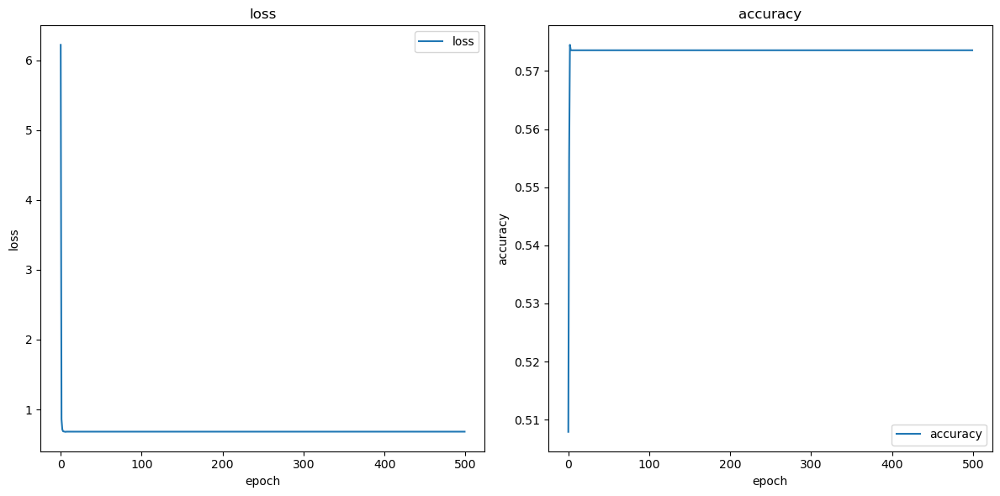

en gång till...
...
68/68 [==============================] - 0s 2ms/step - loss: 0.6823 - accuracy: 0.5736
loss: 0.6822963953018188
accuracy: 0.5735567808151245


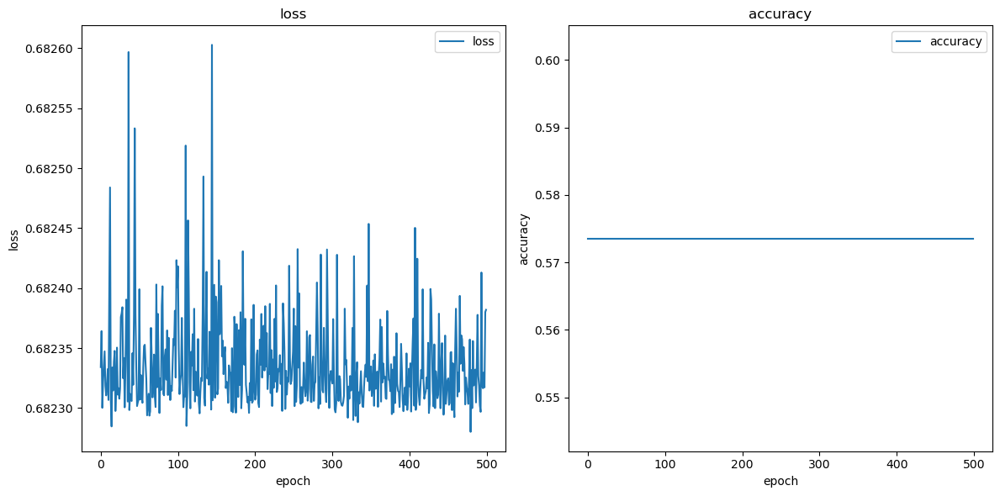

en gång till...
...
68/68 [==============================] - 0s 2ms/step - loss: 0.6823 - accuracy: 0.5736
loss: 0.682290256023407
accuracy: 0.5735567808151245


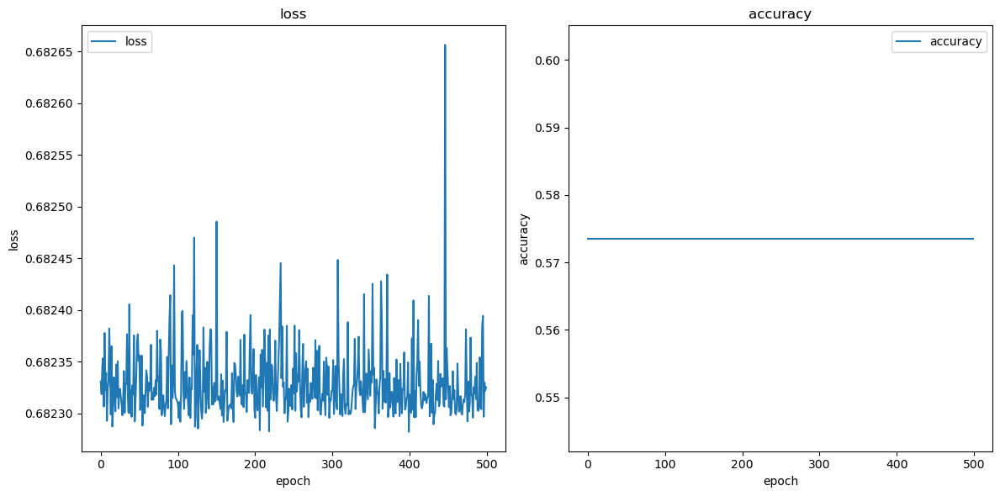

en gång till...
...


KeyboardInterrupt: 

In [14]:
# skapa och spara modellen
if os.path.exists(PATH + '/model.h5'):
    model = tf.keras.models.load_model(PATH + '/model.h5')
    score = model.evaluate(X, y)
    loss_dl = score[0]
    accuracy_dl = score[1]
    print('Modellet finns redan.. laddar upp det')
    print('\n')

else:
    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.Dense(8, input_dim=X.shape[1], activation='relu', name='input'))
    model.add(tf.keras.layers.Dense(12, activation='relu', name='hidden1'))
    model.add(tf.keras.layers.Dense(12, activation='relu', name='hidden2'))
    model.add(tf.keras.layers.Dense(1, activation='sigmoid', name='output'))

    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    print('Modell skapas... ')
    print('Training...')
    print(f"vi måste få en loss mindre än {loss_reg} och en accuracy större än {accuracy_reg}")
    print('...')
    print('\n')

    print(model.summary())

    while True:

        history = model.fit(X, y, epochs=500, batch_size=120, verbose=0)
        score = model.evaluate(X, y)
        loss_dl = score[0]
        accuracy_dl = score[1]
        print('loss:', loss_dl)
        print('accuracy:', accuracy_dl)
        fn.print_history(history)

        if loss_dl < loss_reg and accuracy_dl > accuracy_reg:
            print('Bra gjort!!')
            print('jag sparar modellen i filen...')
            print('\n')
            # spara modellen i filen
            model.save(PATH + '/model.h5')
            break

        print('en gång till...')
        print('...')

predictions_nn = model.predict(X)
predictions_nn = [1 if x > 0.5 else 0 for x in predictions_nn]

In [16]:
# printa ut information om resultatet
print('==================================================')
print('Logistic Regression')
print('==================================================')
print('Loss: ', loss_reg)
print('Accuracy: ', logisticRegr.score(X, y))
print('--------------------------------------------------')
print('classification report')
print(classification_report(y, logisticRegr.predict(X)))
print('--------------------------------------------------')
print('confusion matrix')
print(confusion_matrix(y, predictions))
print('\n')
print('==================================================')
print('Deep Learning')
print('==================================================')
print('loss:', loss_dl)
print('accuracy:', accuracy_dl)
print('--------------------------------------------------')
print('classification report')
print(classification_report(y, predictions_nn))
print('--------------------------------------------------')
print('confusion matrix')
print(confusion_matrix(y, predictions_nn))
print('\n')

Logistic Regression
Loss:  0.32307201516292183
Accuracy:  0.86731843575419
--------------------------------------------------
classification report
              precision    recall  f1-score   support

           0       0.87      0.90      0.89      1232
           1       0.86      0.82      0.84       916

    accuracy                           0.87      2148
   macro avg       0.87      0.86      0.86      2148
weighted avg       0.87      0.87      0.87      2148

--------------------------------------------------
confusion matrix
[[1108  124]
 [ 161  755]]


Deep Learning
loss: 0.682290256023407
accuracy: 0.5735567808151245
--------------------------------------------------
classification report


NameError: name 'predictions_nn' is not defined

Data Preprocessing:

Utför nödvändiga dataförbehandlingssteg på bilddatauppsättningen.
Tillämpa tekniker som storleksändring, normalisering och förstärkning för att förbättra utbildningsdatas kvalitet och mångfald.
Dela upp datasetet i tränings- och testset.
Vad vi gjorde:

vi har skapat en funktion som har tagit en bild och gjort den till en array och ändrat storleken
vi har genererat en dataram som innehåller data från varje bild

In [17]:
# skapa en variabel för träningsmappen och valideringsmappen
train_dir = os.path.join(PATH, 'train')
validation_dir = os.path.join(PATH, 'validation')

# skapa en variabel för batch size och bildstorlek
BATCH_SIZE = 32
IMG_SIZE = (160, 160)
INPUT_SHAPE = IMG_SIZE + (3,)

# skapa en variabel för att lagra träningsdata och valideringsdata
train_dataset = tf.keras.utils.image_dataset_from_directory(train_dir, shuffle=True, batch_size=BATCH_SIZE, image_size=IMG_SIZE)
validation_dataset = tf.keras.utils.image_dataset_from_directory(validation_dir, shuffle=Tru

SyntaxError: unexpected EOF while parsing (1282338261.py, line 12)

In [ ]:
# skapa en variabel för att lagra klassnamn
class_names = train_dataset.class_names
print(f'I mapperna finns {len(class_names)} klasser: {class_names}')
print('\n')
print('Nu ska vi plotta några bilder från träningsdatasetet')

# plotta några bilder från träningsdatasetet
plt.figure(figsize=(10, 10))
for images, labels in train_dataset.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

Eftersom den ursprungliga datauppsättningen inte innehåller en testuppsättning ska du skapa en. För att göra detta bestämmer du hur många batcher av data som finns tillgängliga i valideringsuppsättningen med hjälp av tf.data.experimental.cardinality , och flyttar sedan 20% av dem till en testuppsättning.

In [ ]:
# sätta upp data för att träna modellen
val_batches = tf.data.experimental.cardinality(validation_dataset)
test_dataset = validation_dataset.take(val_batches // 5)
validation_dataset = validation_dataset.skip(val_batches // 5)

print('Antal valideringsbatcher: %d' % tf.data.experimental.cardinality(validation_dataset))
print('Antal testbatcher: %d' % tf.data.experimental.cardinality(test_dataset))

Vi konfigurerar datauppsättningen för att förbättra prestanda

Använd buffrad förladdning för att ladda bilder från disk utan I/O-krascher. Mer information om den här metoden finns i Data Performance Guide 

In [ ]:
# sätta AUTOTUNE för att förbättra prestanda
AUTOTUNE = tf.data.AUTOTUNE

train_dataset = train_dataset.prefetch(buffer_size=AUTOTUNE)
validation_dataset = validation_dataset.prefetch(buffer_size=AUTOTUNE)
test_dataset = test_dataset.prefetch(buffer_size=AUTOTUNE)

Building a CNN Model:

Designa och implementera en konvolutionellt neuralt nätverk (CNN) arkitektur för bild
klassificering.

Experimentera med olika nätverksarkitekturer, variera antalet lager, filter storlekar och ktiveringsfunktioner.
Använda tekniker som batchnormalisering och bortfall för regularisering.
Vad vi gjorde:

vi har skapat en CNN-modell med 3 Convolotional lager och 4 Dense-lager, och normaliserat data med BatchNormalization. Vi använde också Dropout för att undvika overfitting, och SGD som optimizer.
vi har osserved att modellen har en accuracy och loss som är alltid samma värde.

In [ ]:
# Vi skapar CNN-mallen med en dedikerad funktion som returnerar den färdiga mallen
def create_model():
    # skapar vi CNN-mallen
    model = tf.keras.models.Sequential()

    # Convolutional Layer 1
    model.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu', input_shape=INPUT_SHAPE))       # Convolutional Layer
    model.add(tf.keras.layers.MaxPooling2D((2, 2)))                                                 # Pooling Layer

    # Batch Normalisation
    model.add(tf.keras.layers.BatchNormalization())                                                 # Batch Normalisation

    # Convolutional Layer 2
    model.add(tf.keras.layers.Conv2D(32, (3, 3), activation='relu'))                                # Convolutional Layer
    model.add(tf.keras.layers.MaxPooling2D((2, 2)))                                                 # Pooling Layer

    # Convolutional Layer 3
    model.add(tf.keras.layers.Conv2D(16, (3, 3), activation='relu'))                                # Convolutional Layer
    model.add(tf.keras.layers.MaxPooling2D((2, 2)))                                                 # Pooling Layer

    # aggiungiamo un layer di flatten e due layer densi
    model.add(tf.keras.layers.Flatten())

    # calcoliamo la dimensione del layer di flatten
    flatten_dim = model.output_shape[1]

    # Layer Dense 1: Input Layer + Dropout Layer
    model.add(tf.keras.layers.Dense(32, input_dim=flatten_dim, activation='relu', name='input'))                           # Dense Layer
    model.add(tf.keras.layers.Dropout(0.4))                                                         # Dropout Layer

    # Layer Dense 2: Hidden Layer + Dropout Layer
    model.add(tf.keras.layers.Dense(64, activation='relu', name='hidden'))                          # Dense Layer
    model.add(tf.keras.layers.Dropout(0.4))                                                         # Dropout Layer
    # Layer Dense 3: Hidden Layer + Dropout Layer
    model.add(tf.keras.layers.Dense(64, activation='relu', name='hidden2'))                         # Dense Layer
    model.add(tf.keras.layers.Dropout(0.4))                                                         # Dropout Layer

    # Layer Dense 4: Output Layer
    model.add(tf.keras.layers.Dense(1, activation='sigmoid', name='output'))              # Dense Layer

    # vi optimerar modellen
    optimizer = tf.keras.optimizers.SGD(learning_rate=0.001, momentum=0.9, nesterov=False, clipnorm=1., clipvalue=0.5)

    # compilera modellen
    model.compile(optimizer=optimizer,
                loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
                metrics=[tf.keras.metrics.BinaryAccuracy()])
    
    return model

In [ ]:
# vi skapar CNN-modellen med den funktion som skapades tidigare
model = create_model()

In [ ]:
# vi skriver ut en sammanfattning av modellen
print(model.summary())

In [ ]:
# vi tränar modellen och sparar historiken i en variabel 
history = model.fit(train_dataset, epochs=10, validation_data=validation_dataset)

In [ ]:
# vi utvärderar modellen på tränings- och valideringsdataset
score_train = model.evaluate(train_dataset)
score_validation = model.evaluate(validation_dataset)

print('--------------------------------------------------')
print(f'Train Loss:  {score_train[0]: .4f}')
print(f'Train Accuracy:  {score_train[1]: .4f}')
print('--------------------------------------------------') 
print(f'Validation Loss:  {score_validation[0]: .4f}')
print(f'Validation Accuracy:  {score_validation[1]: .4f}')
print('--------------------------------------------------') 

In [ ]:
# vi skapar modellen i en fil för att kunna använda den senare
model.save(PATH + '/model_cnn.h5')

In [ ]:
# vi printar ut historiken av träningen och valideringen av modellen
fn.print_history(history, val=True)

Transfer Learning:

Utforska överföringsinlärning genom att använda förutbildade CNN-modeller som VGG16, ResNet, eller Inception.
Finjustera de förtränade modellerna på din bilddatauppsättning och utvärdera deras prestanda.
Jämför resultaten med prestandan hos din specialbyggda CNN-modell.
Vad vi gjorde:

vi har laddat ner den förtränade modellen VGG16 och MobileNetV2.
vi har hjälpt modeller med bildförbättringstekniker
vi har använt dataökning för att generera nya roterade och spegelvända bilder för att öka träningsfallen
vi har skalat bilderna till att ha en datamatris mellan -1 och 1 och inte mellan 0 och 255
vi har applicerat förtränade-modellen och sedan een GlobalAveragePooling2D för att sedan bearbeta det med ett lager av neuroner för att få det slutliga resultatet.

https://keras.io/guides/transfer_learning/
https://builtin.com/machine-learning/vgg16
https://towardsdatascience.com/transfer-learning-with-vgg16-and-keras-50ea161580b4
https://github.com/ashushekar/VGG16/blob/master/implementation.py
https://www.tensorflow.org/tutorials/images/transfer_learning?hl=it
Vi skapar en funktion för att generera fler förutbildade och finstämde modeller

In [ ]:
# bildförbättringstekniker för att förbättra modellen
data_augmentation = tf.keras.Sequential([tf.keras.layers.RandomFlip('horizontal'), tf.keras.layers.RandomRotation(0.2),])

# GlobalAveragePooling2D
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

# prediction layer
prediction_layer = tf.keras.layers.Dense(1)

# skapa listor av loss och accuracy för att kunna plotta dem senare
dictionary_score = {}

# lägga till första modellen i listorna
dictionary_score['initial_model'] = [score_train[0], score_train[1], score_validation[0], score_validation[1]]

# sätt antal epoch vi ska träna modellen 
initial_epochs = 10
fine_tune_epochs = 10
total_epochs =  initial_epochs + fine_tune_epochs

VGG16

In [ ]:
# sätta namn på modellen
model_name = 'VGG16'

# VGG16
preprocess_VGG16_input = tf.keras.applications.vgg16.preprocess_input
base_model_VGG16 = tf.keras.applications.VGG16(input_shape=INPUT_SHAPE, include_top=False, weights='imagenet')
base_model_VGG16.trainable = False

# skapa modellen
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = data_augmentation(inputs)
x = preprocess_VGG16_input(x)
x = base_model_VGG16(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = prediction_layer(x)
model = tf.keras.Model(inputs, outputs)

# sätta in en lägre learning rate
base_learning_rate = 0.0001

# kompilera modellen
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              metrics=['accuracy'])

# printa ut en sammanfattning av modellen
print('\n')
print('VGG16: sammanfattning av modellen')
print(model.summary())

# printa ut den första loss och accuracy när modellen inte är tränad
loss0, accuracy0 = model.evaluate(validation_dataset)
print('\n')
print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

# träna modellen
history_vgg16 = model.fit(train_dataset, epochs=initial_epochs, validation_data=validation_dataset)

acc = history_vgg16.history['accuracy']
val_acc = history_vgg16.history['val_accuracy']
loss = history_vgg16.history['loss']
val_loss = history_vgg16.history['val_loss']

# salviamo il modello
model.save(PATH + f'/model_{model_name}.h5')

# vi utvärderar modellen på tränings- och valideringsdataset
score_vgg16_train = model.evaluate(train_dataset)
score_vgg16_validation = model.evaluate(validation_dataset)
print('\n')
print('--------------------------------------------------') 
print(f'Train Loss:  {score_vgg16_train[0]: .4f}')
print(f'Train Accuracy:  {score_vgg16_train[1]: .4f}')
print('--------------------------------------------------')

# vi lägger till den beräknade förlusten och noggrannheten till poängordboken
dictionary_score[model_name] = [score_vgg16_train[0], score_vgg16_train[1], score_v

Finjustera den förtränade modellen VGG16

In [ ]:
# sätta modellens namn
model_name = 'VGG16_fine_tuning'

# sätta base model som trainable
base_model_VGG16.trainable = True

# kompilerar modellen igen
model.compile(loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              optimizer = tf.keras.optimizers.RMSprop(learning_rate=base_learning_rate/10),
              metrics=['accuracy'])

# träna modellen
history_vgg16_fine = model.fit(train_dataset,
                         epochs=total_epochs,
                         initial_epoch=history_vgg16.epoch[-1],
                         validation_data=validation_dataset)

acc += history_vgg16_fine.history['accuracy']
val_acc += history_vgg16_fine.history['val_accuracy']

loss += history_vgg16_fine.history['loss']
val_loss += history_vgg16_fine.history['val_loss']

# salviamo il modello
model.save(PATH + f'/model_{model_name}.h5')

# vi utvärderar modellen på tränings- och valideringsdataset
score_vgg16_pre_train = model.evaluate(train_dataset)
score_vgg16_pre_validation = model.evaluate(validation_dataset)
print('\n')
print('--------------------------------------------------') 
print(f'Train Loss:  {score_vgg16_pre_train[0]: .4f}')
print(f'Train Accuracy:  {score_vgg16_pre_train[1]: .4f}')
print('--------------------------------------------------')

# vi lägger till den beräknade förlusten och noggrannheten till poängordboken
dictionary_score[model_name] = [score_vgg16_pre_train[0], score_vgg16_pre_train[1], sc

Printa ut en grafik som visar accuracy och loss för VGG16 och den VGG16 finjusterade modellen

In [ ]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
#plt.ylim([0, 1.0])
plt.plot([initial_epochs-1,initial_epochs-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
#plt.ylim([0, 1.0])
plt.plot([initial_epochs-1,initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

MobileNetV2

In [ ]:
# bildförbättringstekniker för att förbättra modellen
data_augmentation = tf.keras.Sequential([tf.keras.layers.RandomFlip('horizontal'), tf.keras.layers.RandomRotation(0.2),])

# GlobalAveragePooling2D
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

# prediction layer
prediction_layer = tf.keras.layers.Dense(1)

# skapa listor av loss och accuracy för att kunna plotta dem senare
dictionary_score = {}

# lägga till första modellen i listorna
dictionary_score['initial_model'] = [score_train[0], score_train[1], score_validation[0], score_validation[1]]

# sätt antal epoch vi ska träna modellen 
initial_epochs = 10
fine_tune_epochs = 10
total_epochs =  initial_epochs + fine_tune_epochs

In [ ]:
# sätta namn på modellen
model_name = 'MobileNetV2'

# MobileNetV2
preprocess_MobileNetV2_input = tf.keras.applications.mobilenet_v2.preprocess_input
base_model_MobileNetV2 = tf.keras.applications.MobileNetV2(input_shape=INPUT_SHAPE, include_top=False, weights='imagenet')
base_model_MobileNetV2.trainable = False

# skapa modellen
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = data_augmentation(inputs)
x = preprocess_MobileNetV2_input(x)
x = base_model_MobileNetV2(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = prediction_layer(x)
model = tf.keras.Model(inputs, outputs)

# sätta in en lägre learning rate
base_learning_rate = 0.0001

# kompilera modellen
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              metrics=['accuracy'])

# printa ut en sammanfattning av modellen
print('\n')
print('MobileNetV2: sammanfattning av modellen')
print(model.summary())

# printa ut den första loss och accuracy när modellen inte är tränad
loss0, accuracy0 = model.evaluate(validation_dataset)
print('\n')
print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

# träna modellen
history_MobileNetV2 = model.fit(train_dataset, epochs=initial_epochs, validation_data=validation_dataset)

acc = history_MobileNetV2.history['accuracy']
val_acc = history_MobileNetV2.history['val_accuracy']
loss = history_MobileNetV2.history['loss']
val_loss = history_MobileNetV2.history['val_loss']

# salviamo il modello
model.save(PATH + f'/model_{model_name}.h5')

# vi utvärderar modellen på tränings- och valideringsdataset
score_MobileNetV2_train = model.evaluate(train_dataset)
score_MobileNetV2_validation = model.evaluate(validation_dataset)
print('\n')
print('--------------------------------------------------') 
print(f'Train Loss:  {score_MobileNetV2_train[0]: .4f}')
print(f'Train Accuracy:  {score_MobileNetV2_train[1]: .4f}')
print('--------------------------------------------------')

# vi lägger till den beräknade förlusten och noggrannheten till poängordboken
dictionary_score[model_name] = [score_MobileNetV2_train[0], score_MobileNetV2_train[

Finjustera den förtränade modellen MobileNetV2

In [ ]:
# Let's take a look to see how many layers are in the base model
print("Number of layers in the base model: ", len(base_model_MobileNetV2.layers))

In [ ]:
# sätta modellens namn
model_name = 'MobileNetV2_fine_tuning'

# sätta base model som trainable
base_model_MobileNetV2.trainable = True

# Finjustera från detta lager och framåt
fine_tune_at = 100

# Frys alla lager före `fine_tune_at`-lagret
for layer in base_model_MobileNetV2.layers[:fine_tune_at]:
  layer.trainable = False

# kompilerar modellen igen
model.compile(loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              optimizer = tf.keras.optimizers.RMSprop(learning_rate=base_learning_rate/10),
              metrics=['accuracy'])

# träna modellen
history_MobileNetV2_fine = model.fit(train_dataset,
                         epochs=total_epochs,
                         initial_epoch=history_MobileNetV2.epoch[-1],
                         validation_data=validation_dataset)

acc += history_MobileNetV2_fine.history['accuracy']
val_acc += history_MobileNetV2_fine.history['val_accuracy']

loss += history_MobileNetV2_fine.history['loss']
val_loss += history_MobileNetV2_fine.history['val_loss']

# salviamo il modello
model.save(PATH + f'/model_{model_name}.h5')

# vi utvärderar modellen på tränings- och valideringsdataset
score_MobileNetV2_pre_train = model.evaluate(train_dataset)
score_MobileNetV2_pre_validation = model.evaluate(validation_dataset)
print('\n')
print('--------------------------------------------------') 
print(f'Train Loss:  {score_MobileNetV2_pre_train[0]: .4f}')
print(f'Train Accuracy:  {score_MobileNetV2_pre_train[1]: .4f}')
print('--------------------------------------------------')

# vi lägger till den beräknade förlusten och noggrannheten till poängordboken
dictionary_score[model_name] = [score_MobileNetV2_pre_train[0], score_MobileNetV2_

Printa ut en grafik som visar accuracy och loss för MobileNetV2 och den MobileNetV2 finjusterade modellen

In [ ]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
#plt.ylim([0, 1.0])
plt.plot([initial_epochs-1,initial_epochs-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
#plt.ylim([0, 1.0])
plt.plot([initial_epochs-1,initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

Modellutvärdering:

Träna och utvärdera dina CNN-modeller på testdatauppsättningen.
Använd lämpliga utvärderingsmått som noggrannhet, precision, återkallelse och F1 Göra.
Analysera och tolka resultaten för att få insikter i modellens prestanda.
Vad vi gjorde:

vi har utvärderat varje modeller med classification report och confusion matrix
vi har jämfört varje modeller med varandra
Vi utvecklar en cykel som gör att vi kan utvärdera alla modeller och jämföra resultaten

In [ ]:
# skapa en loop där vi laddar h5-modellfilen, använder den för att göra förutsägelser och sedan raderar den
# läs filer med tillägget h5 i datamappen
dir = os.listdir(PATH)
dir = [file for file in dir if file.endswith('.h5')]

# vi tar bort elementet model.h5, eftersom det är modellen vi skapade i början för att bearbeta data från excel-filen
dir.remove('model.h5')

In [ ]:
# skapa image och label variabler
image_batch, label_batch = test_dataset.as_numpy_iterator().next()

Slutsatser

från utvärderingen av alla modeller framgår det att VGG16-modellen är den som gav den bästa noggrannheten och den bästa förvirringsmatrisen bland alla.

VGG16 finjusterad visade sig dock vara den långsammaste av alla.

Modellen med bäst prestanda visade sig vara den finjusterade MobileNetV2.

In [ ]:
# med en for-loop laddar vi modellerna och gör förutsägelserna
# vi beräknar klassificeringsrapporten och förvirringsmatrisen

for file in dir:
    # ladda modellen
    model = tf.keras.models.load_model(PATH + '/' + file)

    # utvärdera modellen
    score = model.evaluate(test_dataset)

    # förutsägelser
    predictions = model.predict_on_batch(image_batch).flatten()
    predictions = tf.nn.sigmoid(predictions)
    predictions = [1 if x > 0.5 else 0 for x in predictions]

    # beräkna klassificeringsrapporten och förvirringsmatrisen
    print('==================================================')
    print(file)
    print('==================================================')
    print(f'Test Loss:  {score[0]: .4f}')
    print(f'Test Accuracy:  {score[1]: .4f}')
    print('--------------------------------------------------')
    print('classification report')
    print(classification_report(label_batch, predictions))
    print('--------------------------------------------------')
    print('confusion matrix')
    print(confusion_matrix(label_batch, predictions))
    print('\n')